(8, 720192)
[0.00000000e+00 6.25000000e-05 1.25000000e-04 ... 4.50118125e+01
 4.50118750e+01 4.50119375e+01]
mean:  0.0002169736257540198


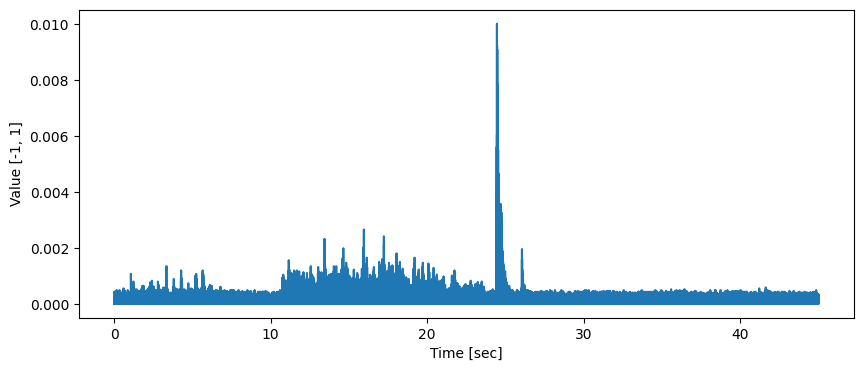

In [3]:
import wave
import numpy as np
import scipy.signal as sg
from pathlib import Path
import matplotlib.pyplot as plt
import math

def calc_array_manifold_vector(theta, n_mic, n_bin, fs, N, c):
    # ysinΘ + xcosΘ
    """
    a: i x n_mic x 1 x n_bin
       方向数 x マイク数 x 1 x 周波数ビン数
    """
    rc = 0.0365
    mic_angle = np.array(
        [
            0,
            -np.pi / 4,
            -np.pi / 2,
            -np.pi * 3 / 4,
            np.pi,
            np.pi * 3 / 4,
            np.pi * 1 / 2,
            np.pi * 1 / 4,
        ]
    )
    a = np.zeros((theta.shape[0], n_mic, 1, n_bin), dtype=np.complex64)
    for i, th in enumerate(theta):
        th = np.radians(th)
        for k in range(n_bin):
            fk = fs * k / N
            for m in range(n_mic):
                delay = -rc * np.cos(th - mic_angle[m]) / c
                a[i, m, 0, k] = np.exp(-1j * 2 * np.pi * fk * delay)
    return a


def load_onefile(file_name):
    """
    return M x frames ndarray
    """
    wav = wave.open(file_name)
    # print("sample width:", wav.getsampwidth())
    # print("channel num:", wav.getnchannels())
    # print("frames:", wav.getnframes())

    M = wav.getnchannels()

    data = wav.readframes(wav.getnframes())
    data = np.frombuffer(data, dtype=np.int16)
    data = data / np.iinfo(np.int16).max

    multi_data = data.reshape(-1, M)
    multi_data = np.transpose(multi_data)
    # print("multi_data.shape:", multi_data.shape)

    wav.close()

    return multi_data

def lower_bound(arr, num):
    left = 0
    right = len(arr) - 1
    while left <= right:
        mid = (left + right) // 2
        if arr[mid] <= num:
            left = mid + 1
        if arr[mid] > num:
            right = mid - 1
    # print("left: ", left, " right: ", right)
    return right


def MUSIC(file_name, t_left_sec, t_right_sec, start_angle, end_angle):
    n_mic = 8
    n_src = 3
    N = 512
    window = "hann"
    c = 340
    freq_l = 300
    freq_h = 1500

    fs = 16000
    k_l = int(freq_l / (fs / N))
    k_h = int(freq_h / (fs / N))

    audio = load_onefile(file_name)

    # print(audio.shape)
    f, t, X = sg.stft(audio, fs, window=window, nperseg=N)
    n_bin = X.shape[1]
    # print(t)
    t_left_index = lower_bound(t, t_left_sec)
    t_right_index = lower_bound(t, t_right_sec)

    theta = np.linspace(
        start_angle, end_angle, num=((end_angle - start_angle) // 5) + 1
    )
    P_MU = np.zeros(theta.shape[0])

    a = calc_array_manifold_vector(theta, n_mic, n_bin, fs, N, c)
    # print(X.shape)
    X_trimed = X[:, :, t_left_index:t_right_index]
    XH = np.conjugate(X_trimed)
    XXH = np.einsum("mki,nki->mnki", X_trimed, XH)
    R = np.mean(XXH, axis=3)

    eig_val = np.zeros((n_mic, n_bin), dtype=np.complex64)
    eig_vec = np.zeros((n_mic, n_mic, n_bin), dtype=np.complex64)
    beta = np.zeros(n_bin)
    for k in range(n_bin):
        eig_val_k, eig_vec_k = np.linalg.eig(
            R[:, :, k]
        )  # 周波数ごとに固有値、固有ベクトルを算出
        sort = np.argsort(-1.0 * np.abs(eig_val_k))
        eig_val[:, k] = eig_val_k[sort]
        eig_vec[:, :, k] = eig_vec_k[:, sort]

    W = eig_vec[:, n_src:, :]
    beta = np.sum(np.abs(eig_val[:n_src, :]), axis=0)

    for i, th in enumerate(theta):
        aH = np.conjugate(a[i])
        aHa = np.einsum("mik,mjk->ijk", aH, a[i])
        P_MU_th = np.einsum("mik,mek->iek", aH, W)
        P_MU_th = np.einsum("iek,jek->ijk", P_MU_th, np.conjugate(P_MU_th))
        P_MU_th = np.abs(aHa) / np.abs(P_MU_th)
        P_MU[i] = np.mean(beta[k_l : k_h + 1] * P_MU_th[0, 0, k_l : k_h + 1])

    P_MU = 10 * np.log10(P_MU)

    return P_MU

dir_name = str(Path.cwd().parent) + "/cart_datas/"
audio = load_onefile(dir_name + "cart_left600toright600_100_0.wav")
print(audio.shape)

sample_rate = 16000

x = np.array(range(audio.shape[1])) / sample_rate
print(x)

start_time = 10.8
end_time = 23.0
start_index = int(start_time * sample_rate)
end_index = int(end_time * sample_rate)
print("mean: ", np.mean(abs(audio[0][start_index:end_index])))

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x, abs(audio[0]))




def make_sec_list(sec_left, sec_right, odd):
  ret = np.array([], dtype=float)
  while(sec_left <= sec_right):
    ret = np.append(ret, sec_left)
    sec_left += odd
  return ret

def display_one_file(file_name, sec_left, sec_right):
  plt.figure(figsize=(24, 16))
  start_angle = -180
  end_angle = 180
  theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
  theta = np.deg2rad(theta)
  
  t_sec_list_1 = make_sec_list(sec_left, sec_right, 0.2)
  interval_num = t_sec_list_1.shape[0]-1
  row_num = 5
  col_num = interval_num // row_num + 1

  for i in range(interval_num):
    P_MU = MUSIC(file_name, t_left_sec=t_sec_list_1[i], t_right_sec=t_sec_list_1[i+1], start_angle=start_angle, end_angle=end_angle)
    ax = plt.subplot(
      row_num, col_num, i+1, projection="polar"
    )
    ax.plot(theta, P_MU)
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    
def display_one_scene(file_name, sec_left, sec_right):
  plt.figure(figsize=(5, 3))
  start_angle = -180
  end_angle = 180
  theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
  theta = np.deg2rad(theta)
  P_MU = MUSIC(file_name, t_left_sec=sec_left, t_right_sec=sec_right, start_angle=start_angle, end_angle=end_angle)
  ax = plt.subplot(
    1, 1, 1, projection="polar"
  )
  ax.plot(theta, P_MU)
  ax.set_theta_zero_location("N")
  ax.set_theta_direction(-1)

def compare_two_file(file_name_1, sec_left_1,  sec_right_1, file_name_2, sec_left_2, sec_right_2):
  plt.figure(figsize=(24, 16))
  start_angle = -180
  end_angle = 180
  theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
  theta = np.deg2rad(theta)
  
  t_sec_list_1 = make_sec_list(sec_left_1, sec_right_1, 0.2)
  interval_num = t_sec_list_1.shape[0]-1
  row_num = 5
  col_num = interval_num // row_num + 1

  for i in range(interval_num):
    P_MU = MUSIC(file_name_1, t_left_sec=t_sec_list_1[i], t_right_sec=t_sec_list_1[i+1], start_angle=start_angle, end_angle=end_angle)
    ax = plt.subplot(
      row_num, col_num, i+1, projection="polar"
    )
    ax.plot(theta, P_MU, color="blue")
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    
  t_sec_list_2 = make_sec_list(sec_left_2, sec_right_2, 0.2)
  interval_num = t_sec_list_2.shape[0]-1
  row_num = 5
  col_num = interval_num // row_num + 1
  
  print(row_num)
  print(col_num)

  for i in range(interval_num):
    P_MU = MUSIC(file_name_2, t_left_sec=t_sec_list_2[i], t_right_sec=t_sec_list_2[i+1], start_angle=start_angle, end_angle=end_angle)
    ax = plt.subplot(
      row_num, col_num, i+1, projection="polar"
    )
    ax.set_xlabel(str(round(t_sec_list_2[i], 1)))
    ax.plot(theta, P_MU, color="red")
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    
def compare_two_file_district(file_name_1, sec_left_1,  sec_right_1, file_name_2, sec_left_2, sec_right_2, one=False):
  start_angle = -180
  end_angle = 180
  theta_num = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
  theta = np.deg2rad(theta_num)

  P_MU_1 = MUSIC(file_name_1, t_left_sec=sec_left_1, t_right_sec=sec_right_1, start_angle=start_angle, end_angle=end_angle)
  
  P_MU_2 = MUSIC(file_name_2, t_left_sec=sec_left_2, t_right_sec=sec_right_2, start_angle=start_angle, end_angle=end_angle)
  
  fig, ax1 = plt.subplots(figsize=(5,3))
  
  ax1.plot(theta_num, P_MU_1, "b-", label="spec1")
  ax1.set_xlabel("Angle sec:" + str(round(sec_left_1, 1)))
  ax1.set_ylabel("spec1")
  ax1.tick_params(axis="y", labelcolor="b")
  
  ax2 = ax1.twinx()
  ax2.plot(theta_num, P_MU_2, "r-", label="spec2")
  ax2.set_ylabel("spec2", color="r")
  ax2.tick_params(axis="y", labelcolor="r")
  
  fig.suptitle('Comparison of Two Spatial Spectra with Different Y-Axes')
  ax1.grid(True)
  ax1.set_xlim(-180, 180)
  ax1.set_xticks(np.arange(-180, 185, 30))
  
  lines_1, labels_1 = ax1.get_legend_handles_labels()
  lines_2, labels_2 = ax2.get_legend_handles_labels()
  ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')
  plt.show()
  
def one_file_visualize(file_name, sec_left, sec_right):
  start_angle = -180
  end_angle = 180
  theta_num = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
  theta = np.deg2rad(theta_num)
  P_MU = MUSIC(file_name, t_left_sec=sec_left, t_right_sec=sec_right, start_angle=start_angle, end_angle=end_angle)
  plt.figure(figsize=(5, 3))
  plt.plot(theta_num, P_MU, "b-")
  plt.xlabel("Angle sec:" +  str(round(sec_left, 1)))
  plt.ylabel("spec")
  plt.grid(True)
  plt.xlim(-180, 180)
  plt.xticks(np.arange(-180, 185, 30))

[0.00000000e+00 6.25000000e-05 1.25000000e-04 ... 3.00118125e+01
 3.00118750e+01 3.00119375e+01]


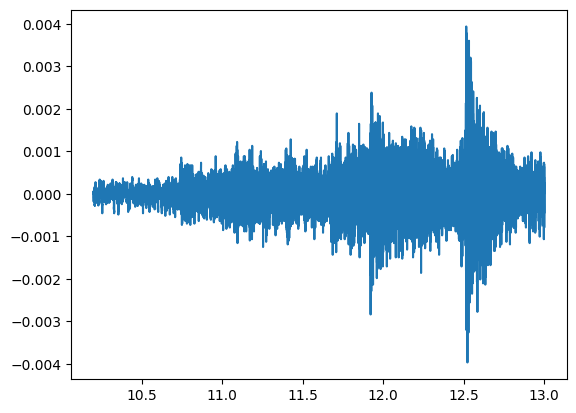

In [12]:
x = np.array(range(audio.shape[1])) / sample_rate
print(x)

# 拡大する
start_time = 10.2
end_time = 13.0

start_index = int(start_time * sample_rate)
end_index = int(end_time * sample_rate)

plt.plot(x[start_index:end_index], audio[0][start_index:end_index])
plt.show()

mean:  0.0002195987960448012


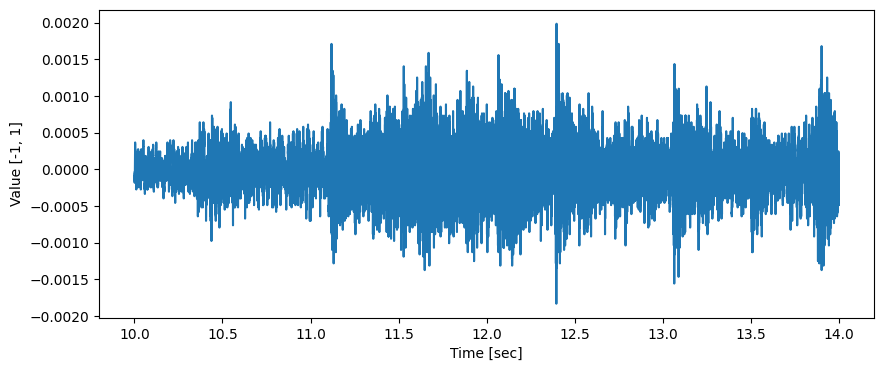

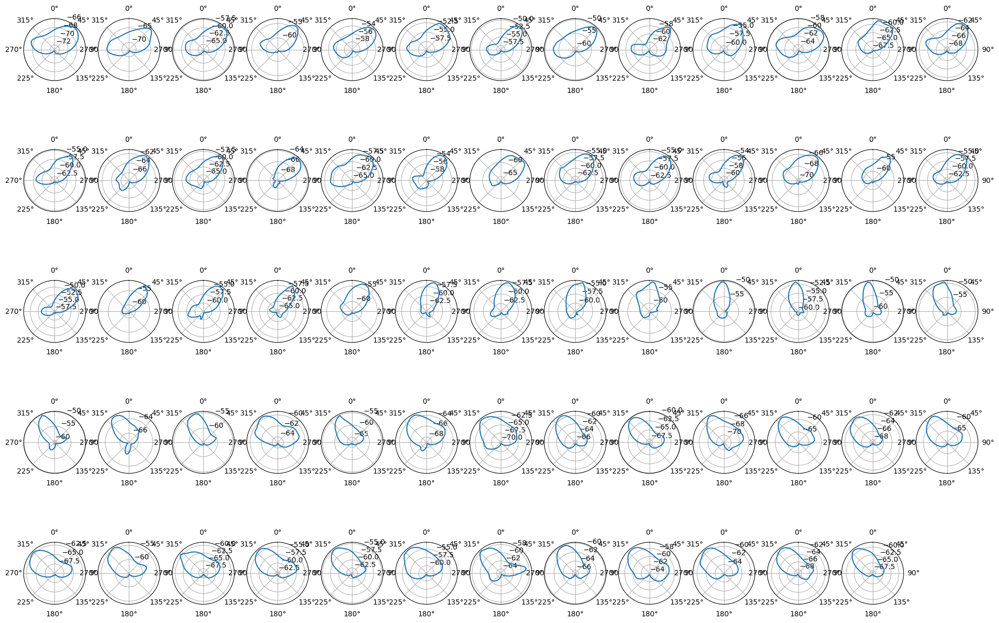

In [6]:
plt.figure(figsize=(10, 4))
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_50_0.wav"
sample_rate = 16000

audio = load_onefile(file_name)
x = np.array(range(audio.shape[1])) / sample_rate
start_time = 10.0
end_time = 14.0
start_index = int(start_time * sample_rate)
end_index = int(end_time * sample_rate)
print("mean: ", np.mean(abs(audio[0][start_index:end_index])))


plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x[start_index:end_index], audio[0][start_index:end_index])

plt.figure(figsize=(24, 16))
start_angle = -180
end_angle = 180
theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
theta = np.deg2rad(theta)

t_sec_list = np.linspace(10.8, 22, num=int((24-11) // 0.2) + 1)
interval_num = t_sec_list.shape[0]-1
row_num = 5
col_num = interval_num // row_num + 1

for i in range(interval_num):
  P_MU = MUSIC(file_name, t_left_sec=t_sec_list[i], t_right_sec=t_sec_list[i+1], start_angle=start_angle, end_angle=end_angle)
  ax = plt.subplot(
    row_num, col_num, i+1, projection="polar"
  )
  ax.plot(theta, P_MU)
  ax.set_theta_zero_location("N")
  ax.set_theta_direction(-1)


mean:  0.00026795203634754483


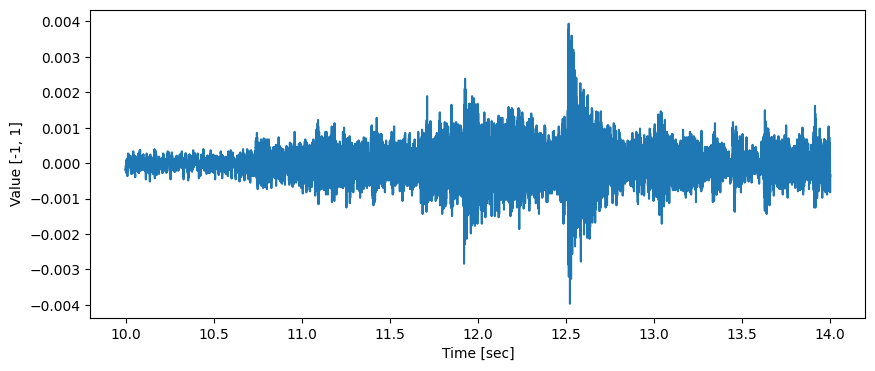

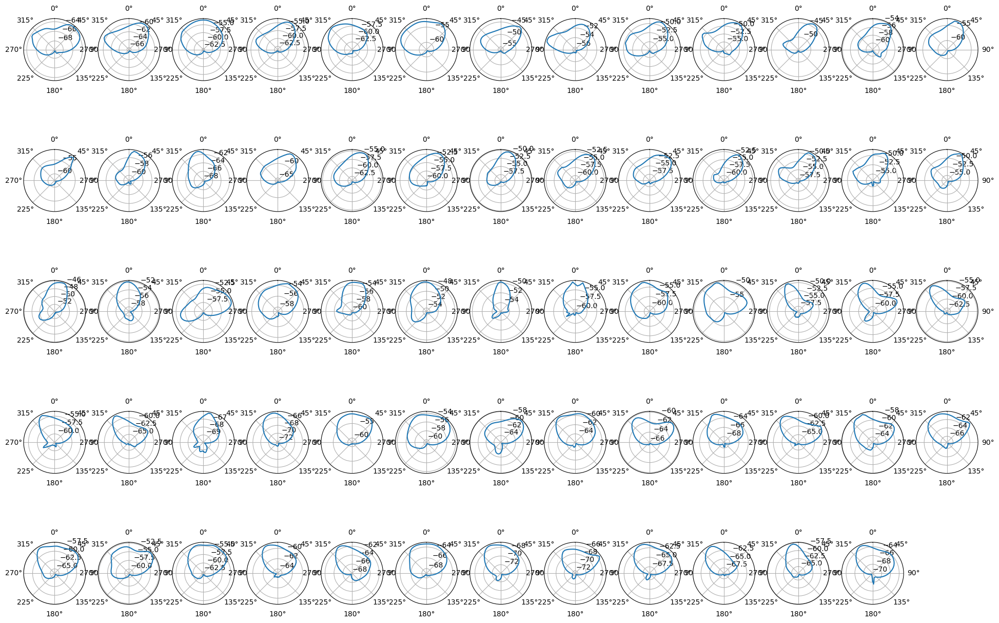

In [36]:

dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_100_0.wav"
sample_rate = 16000

audio = load_onefile(file_name)
x = np.array(range(audio.shape[1])) / sample_rate
start_time = 10.0
end_time = 14.0
start_index = int(start_time * sample_rate)
end_index = int(end_time * sample_rate)
print("mean: ", np.mean(abs(audio[0][start_index:end_index])))

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x[start_index:end_index], audio[0][start_index:end_index])

plt.figure(figsize=(24, 16))
start_angle = -180
end_angle = 180
theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
theta = np.deg2rad(theta)

t_sec_list = np.linspace(10.8, 22, num=int((24-11) // 0.2) + 1)
interval_num = t_sec_list.shape[0]-1
row_num = 5
col_num = interval_num // row_num + 1

for i in range(interval_num):
  P_MU = MUSIC(file_name, t_left_sec=t_sec_list[i], t_right_sec=t_sec_list[i+1], start_angle=start_angle, end_angle=end_angle)
  ax = plt.subplot(
    row_num, col_num, i+1, projection="polar"
  )
  ax.plot(theta, P_MU)
  ax.set_theta_zero_location("N")
  ax.set_theta_direction(-1)


mean:  0.0001666482284005249


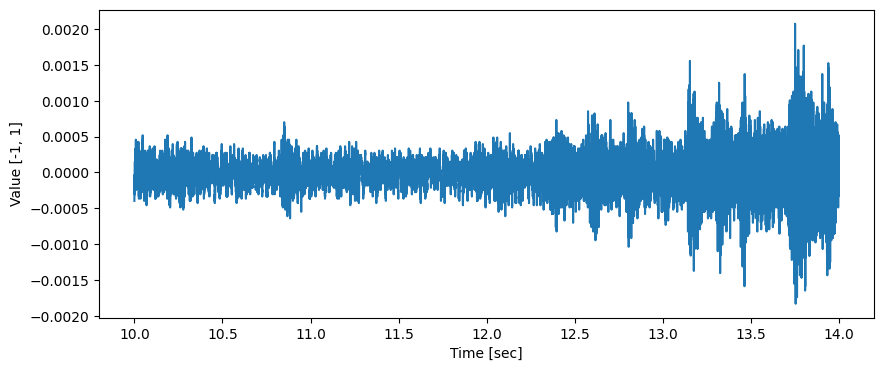

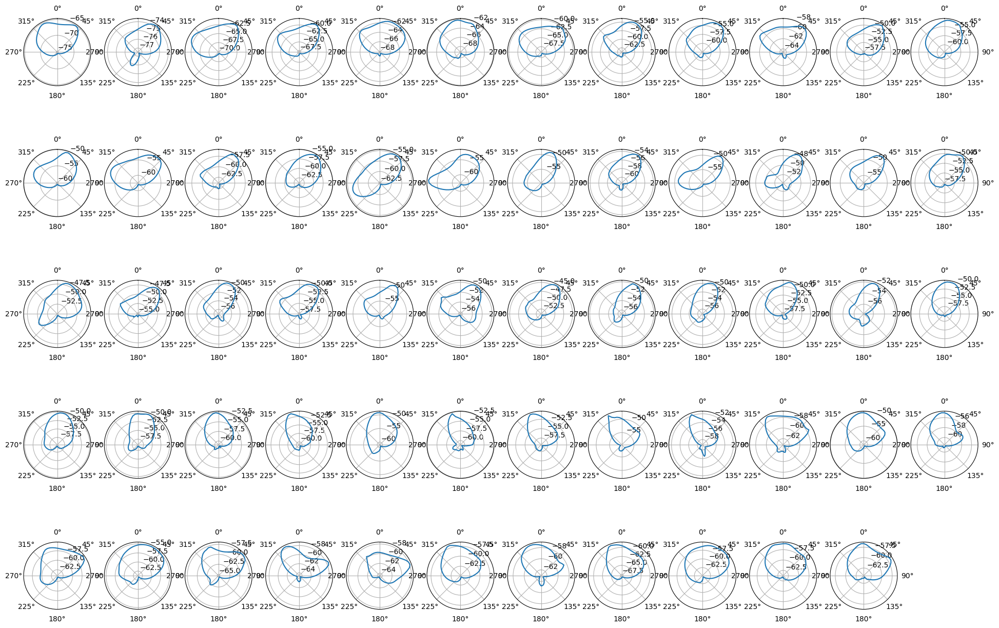

In [35]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_150_0.wav"
sample_rate = 16000


audio = load_onefile(file_name)
x = np.array(range(audio.shape[1])) / sample_rate
start_time = 10.0
end_time = 14.0
start_index = int(start_time * sample_rate)
end_index = int(end_time * sample_rate)
print("mean: ", np.mean(abs(audio[0][start_index:end_index])))

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x[start_index:end_index], audio[0][start_index:end_index])


plt.figure(figsize=(24, 16))

start_angle = -180
end_angle = 180
theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
theta = np.deg2rad(theta)

t_sec_list = np.linspace(12.0, 22, num=int((24-12) // 0.2) + 1)
interval_num = t_sec_list.shape[0]-1
row_num = 5
col_num = interval_num // row_num + 1

for i in range(interval_num):
  P_MU = MUSIC(file_name, t_left_sec=t_sec_list[i], t_right_sec=t_sec_list[i+1], start_angle=start_angle, end_angle=end_angle)
  ax = plt.subplot(
    row_num, col_num, i+1, projection="polar"
  )
  ax.plot(theta, P_MU)
  ax.set_theta_zero_location("N")
  ax.set_theta_direction(-1)


mean:  0.00020762028107547222


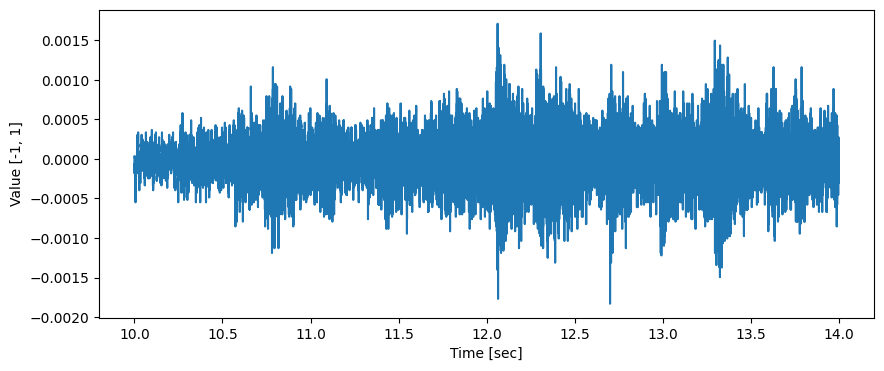

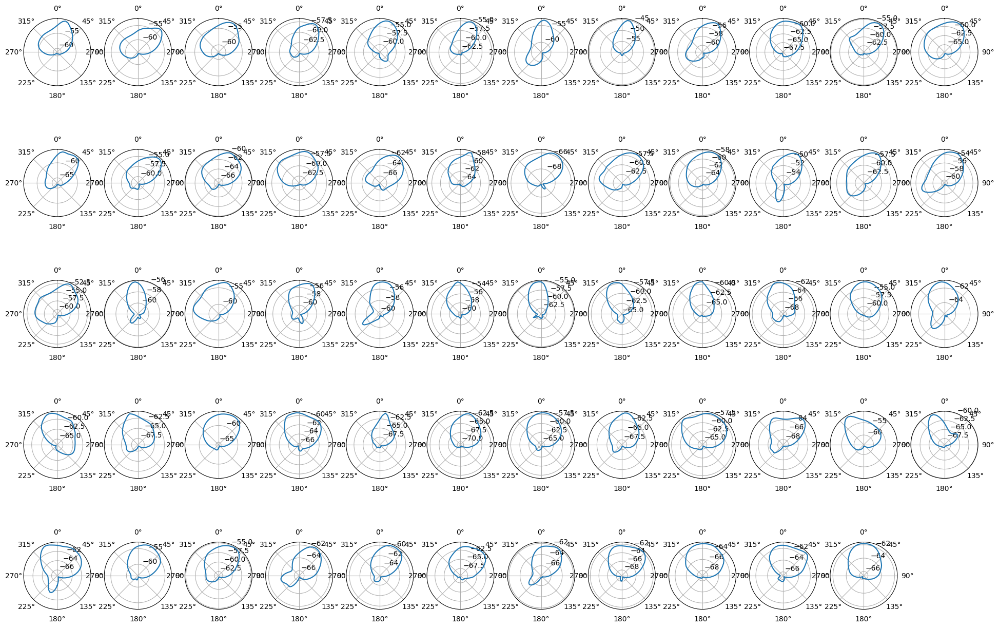

In [37]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_200_0.wav"
sample_rate = 16000


audio = load_onefile(file_name)
x = np.array(range(audio.shape[1])) / sample_rate
start_time = 10.0
end_time = 14.0
start_index = int(start_time * sample_rate)
end_index = int(end_time * sample_rate)
print("mean: ", np.mean(abs(audio[0][start_index:end_index])))

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x[start_index:end_index], audio[0][start_index:end_index])


plt.figure(figsize=(24, 16))

start_angle = -180
end_angle = 180
theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
theta = np.deg2rad(theta)

t_sec_list = np.linspace(12.0, 22, num=int((24-12) // 0.2) + 1)
interval_num = t_sec_list.shape[0]-1
row_num = 5
col_num = interval_num // row_num + 1

for i in range(interval_num):
  P_MU = MUSIC(file_name, t_left_sec=t_sec_list[i], t_right_sec=t_sec_list[i+1], start_angle=start_angle, end_angle=end_angle)
  ax = plt.subplot(
    row_num, col_num, i+1, projection="polar"
  )
  ax.plot(theta, P_MU)
  ax.set_theta_zero_location("N")
  ax.set_theta_direction(-1)


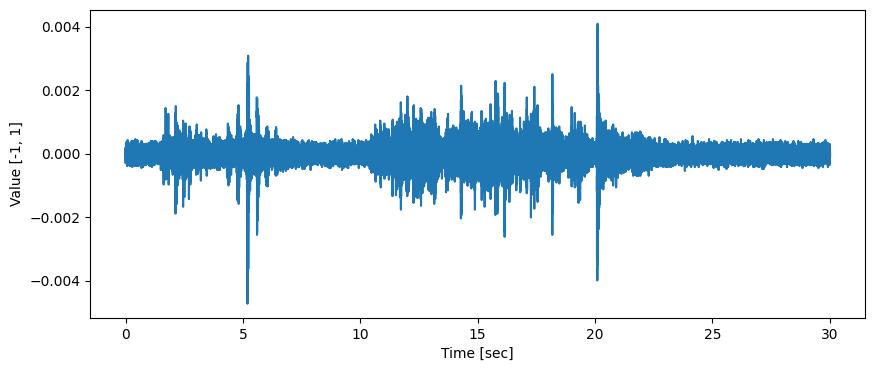

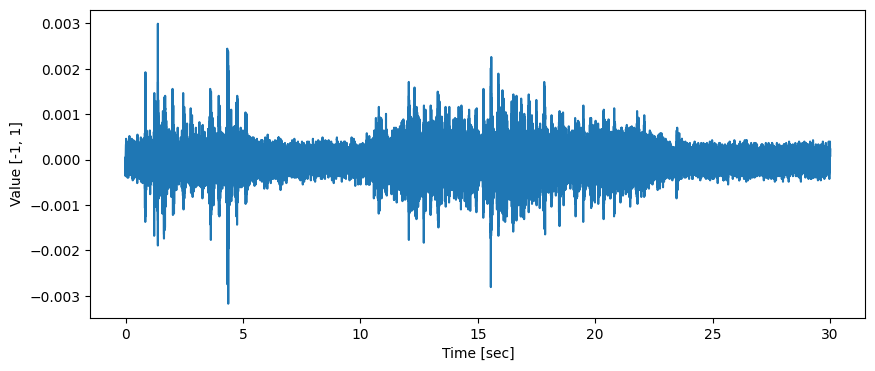

In [12]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_50_2_0.wav"
sample_rate = 16000

audio = load_onefile(file_name)
x = np.array(range(audio.shape[1])) / sample_rate

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x, audio[0])



dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_200_0.wav"
sample_rate = 16000

audio = load_onefile(file_name)
x = np.array(range(audio.shape[1])) / sample_rate

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x, audio[0])


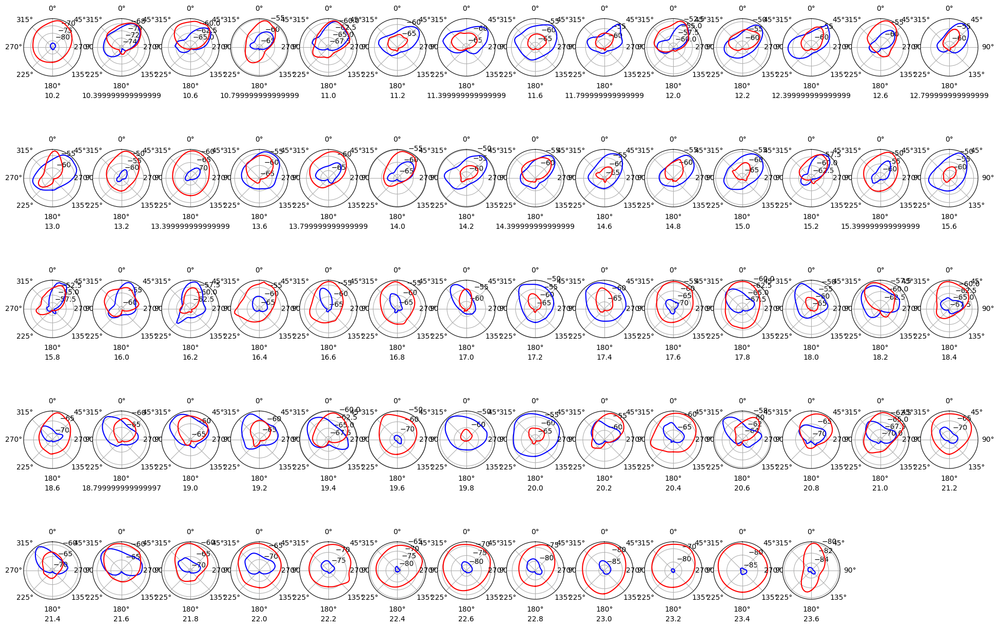

In [13]:
# 50と200を比較

plt.figure(figsize=(24, 16))
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_50_2_0.wav"
sample_rate = 16000

start_angle = -180
end_angle = 180
theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
theta = np.deg2rad(theta)

t_sec_list = np.linspace(10.2, 24, num=int((24-10.2) // 0.2) + 1)
interval_num = t_sec_list.shape[0]-1
row_num = 5
col_num = interval_num // row_num + 1

for i in range(interval_num):
  P_MU = MUSIC(file_name, t_left_sec=t_sec_list[i], t_right_sec=t_sec_list[i+1], start_angle=start_angle, end_angle=end_angle)
  ax = plt.subplot(
    row_num, col_num, i+1, projection="polar"
  )
  ax.plot(theta, P_MU, color="blue")
  ax.set_theta_zero_location("N")
  ax.set_theta_direction(-1)
  


dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_right600toleft600_200_0.wav"
sample_rate = 16000
start_angle = -180
end_angle = 180
theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
theta = np.deg2rad(theta)

t_sec_list = np.linspace(10.2, 24, num=int((24-10.2) // 0.2) + 1)
interval_num = t_sec_list.shape[0]-1
row_num = 5
col_num = interval_num // row_num + 1

for i in range(interval_num):
  P_MU = MUSIC(file_name, t_left_sec=t_sec_list[i], t_right_sec=t_sec_list[i+1], start_angle=start_angle, end_angle=end_angle)
  ax = plt.subplot(
    row_num, col_num, i+1, projection="polar"
  )
  ax.set_xlabel(str(10.2 + i * 0.2))
  ax.plot(theta, P_MU, color="red")
  ax.set_theta_zero_location("N")
  ax.set_theta_direction(-1)


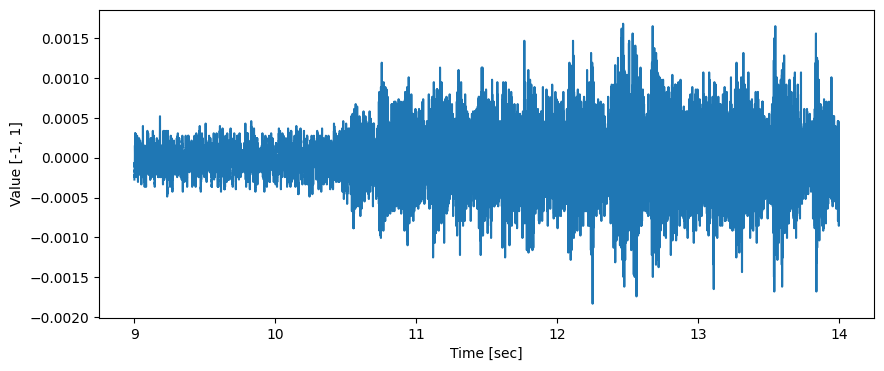

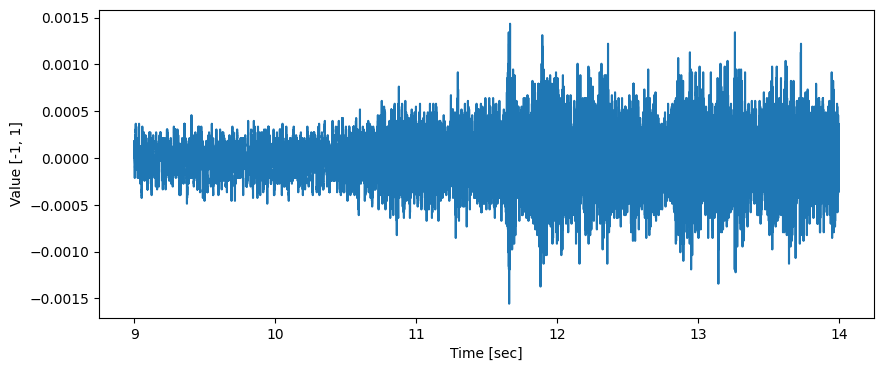

5
14


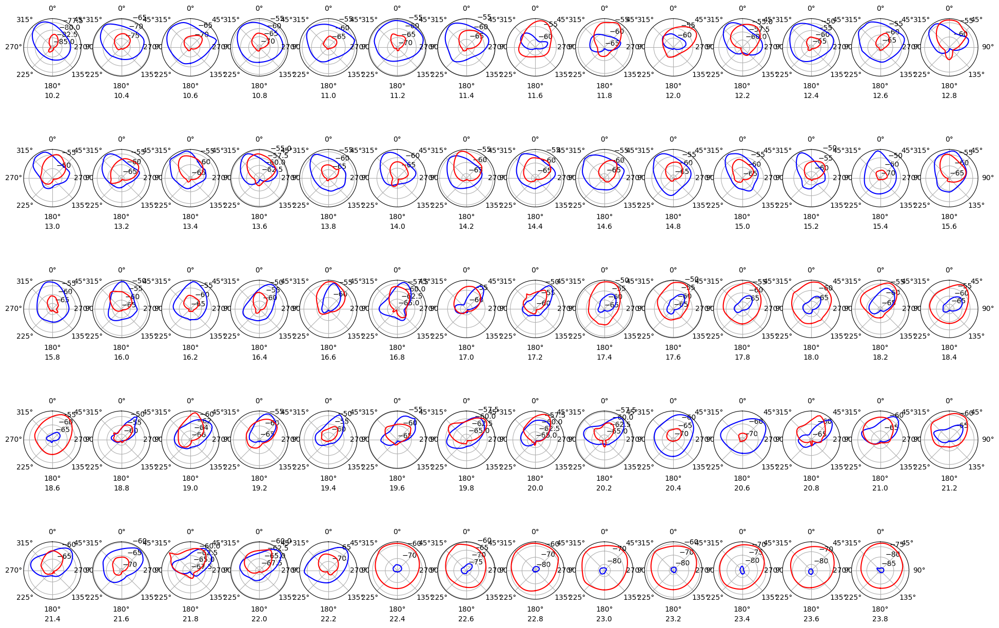

In [4]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_1 = dir_name + "cart_left600toright600_50_2_0.wav"
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_2 = dir_name + "cart_left600toright600_200_0.wav"

sec_left_1 = 10.2
sec_right_1 = 24.0
sec_left_2 = 10.2
sec_right_2 = 24.0

compare_two_file(file_name_1, sec_left_1, sec_right_1, file_name_2, sec_left_2, sec_right_2)


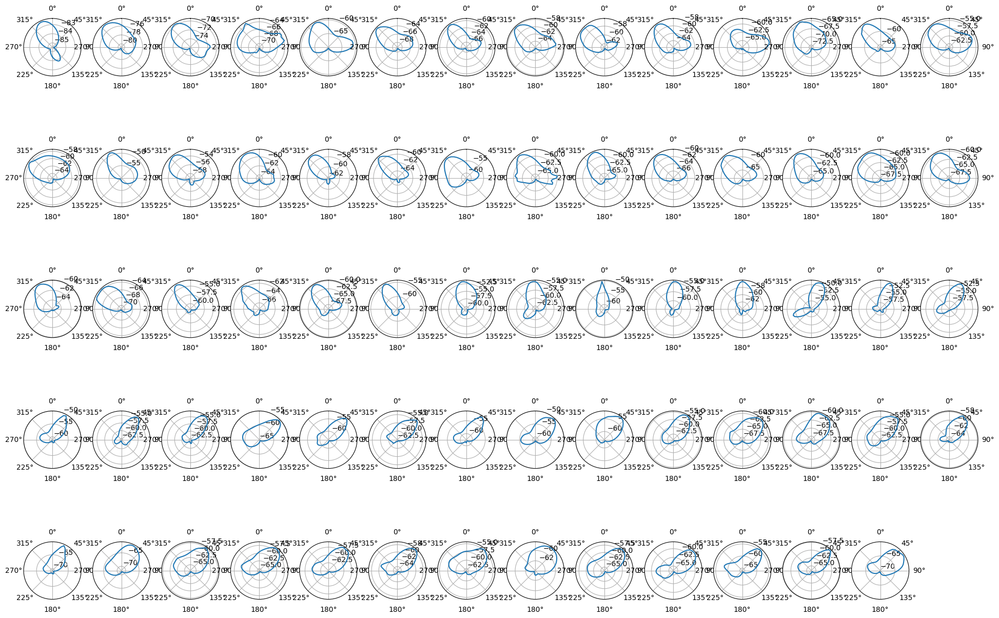

In [8]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_1 = dir_name + "cart_left600toright600_50_2_0.wav"
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name = dir_name + "cart_left600toright600_50_0.wav"

sec_left = 10.2
sec_right = 24.0

display_one_file(file_name, sec_left, sec_right)


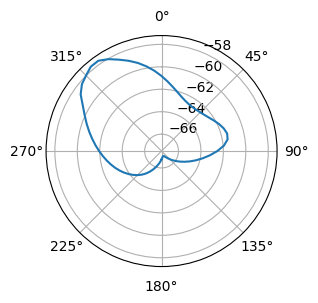

In [9]:
sec_left = 15.0
sec_right = 15.2

display_one_scene(file_name, sec_left, sec_right)

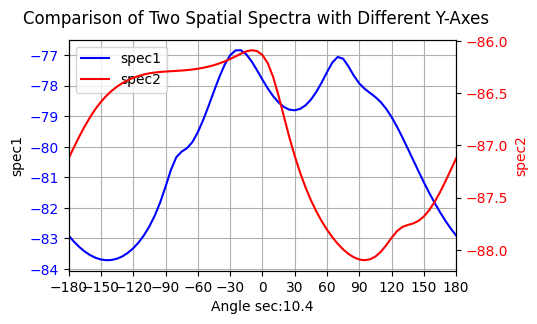

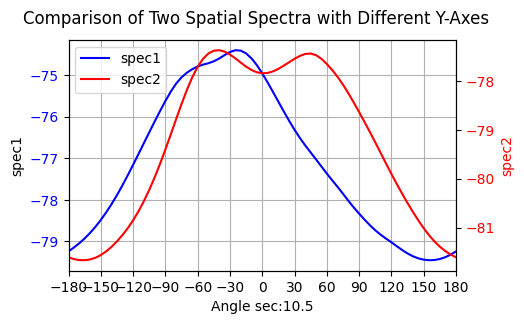

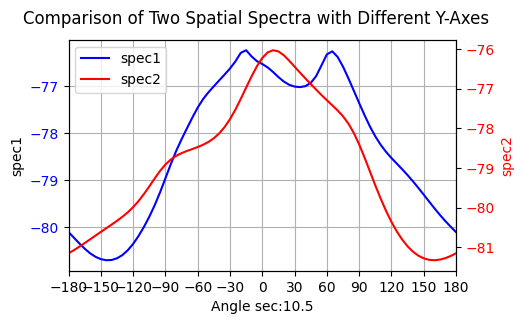

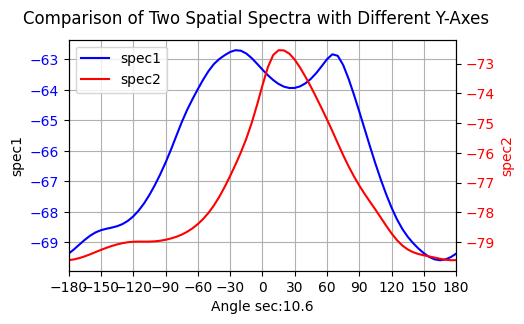

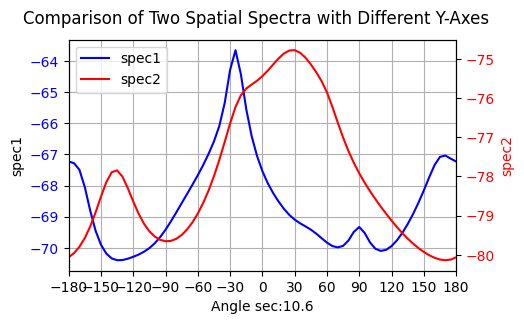

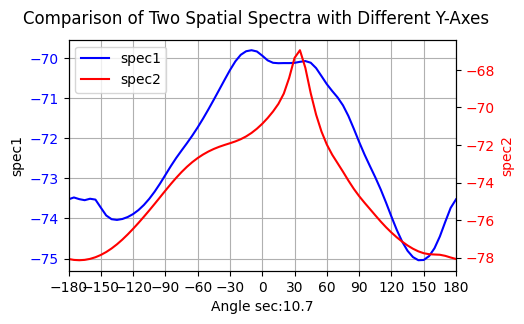

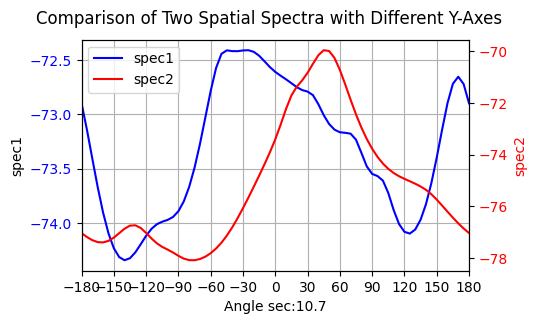

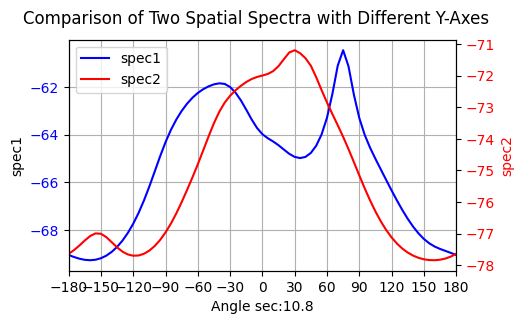

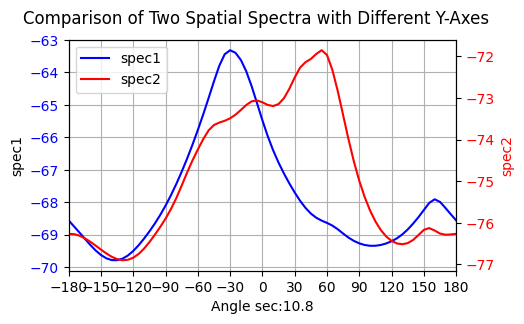

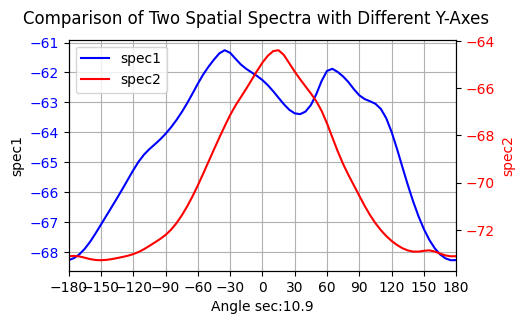

In [131]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_1 = dir_name + "cart_left600toright600_50_2_0.wav"
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_2 = dir_name + "cart_left600toright600_200_0.wav"

sec_left_1 = 10.4
sec_left_2 = 10.4
sec_right_1 = 10.45
sec_right_2 = 10.45
for i in range(10):
  compare_two_file_district(file_name_1, sec_left_1, sec_right_1, file_name_2, sec_left_2, sec_right_2)
  sec_left_1 += 0.05
  sec_left_2 += 0.05
  sec_right_1 += 0.05
  sec_right_2 += 0.05
  
# 200
# 10.2 8/10
# 12.2 5/10
# 14.2-15.0 2/5
# 15.2-16.0 0/5
# 16.2-17.0 0/5
# 17.2-18.0 0/5
# 18.2-20.2 9/10
# 20.2-22.2 4/10

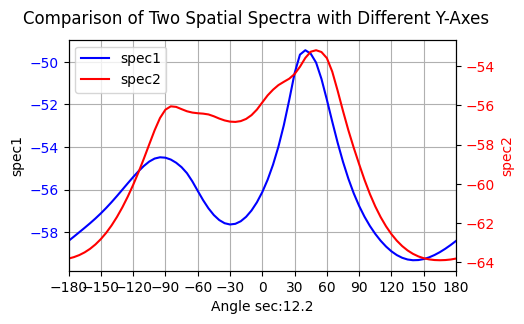

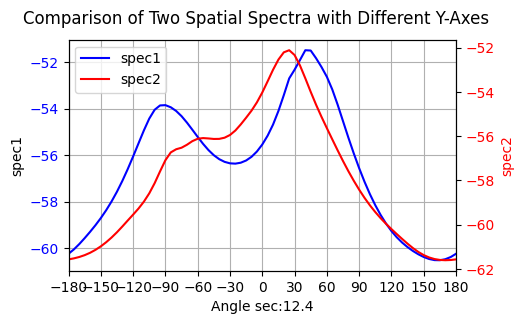

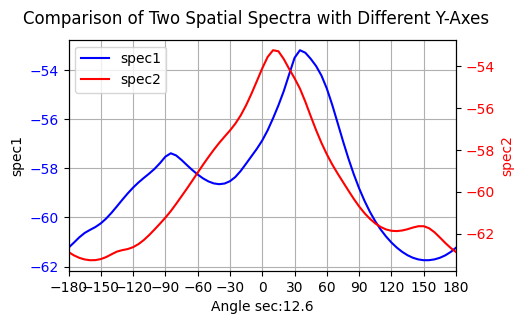

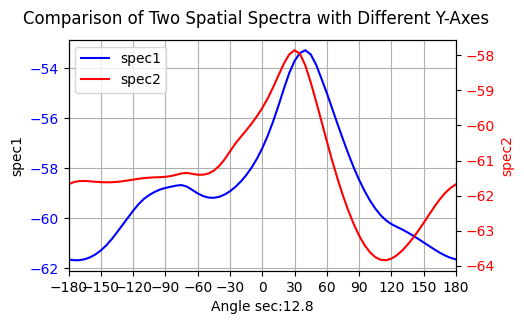

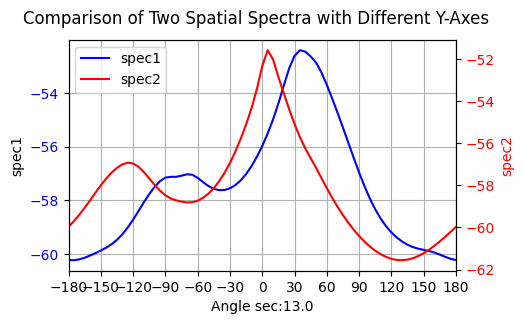

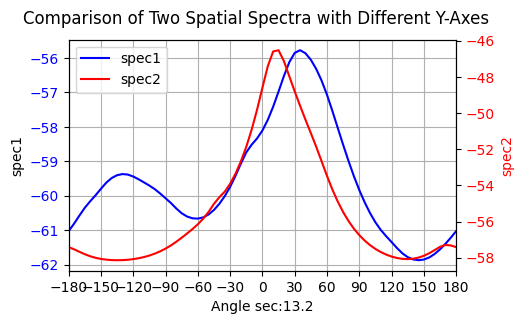

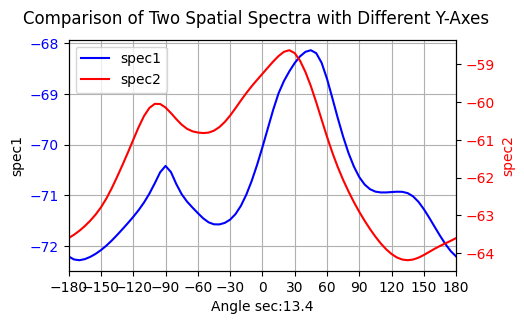

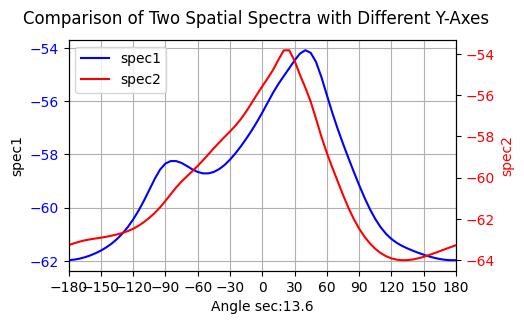

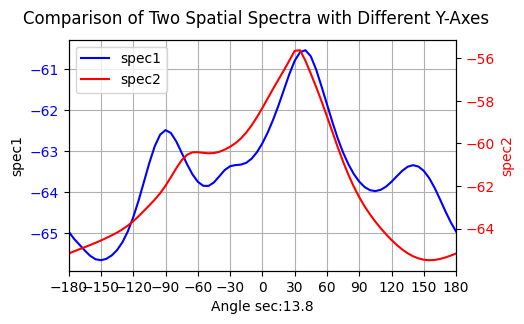

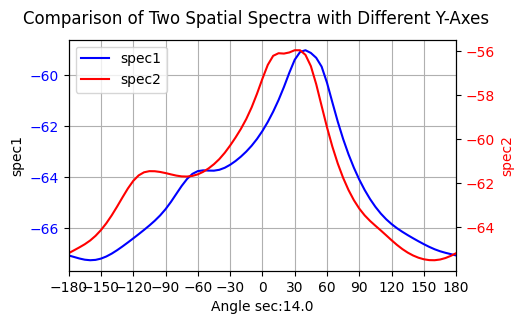

In [129]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_1 = dir_name + "cart_right600toleft600_50_2_0.wav"
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_2 = dir_name + "cart_right600toleft600_200_0.wav"

sec_left_1 = 12.2
sec_left_2 = 12.2
sec_right_1 = 12.4
sec_right_2 = 12.4
for i in range(10):
  compare_two_file_district(file_name_1, sec_left_1, sec_right_1, file_name_2, sec_left_2, sec_right_2)
  sec_left_1 += 0.2
  sec_left_2 += 0.2
  sec_right_1 += 0.2
  sec_right_2 += 0.2
  
# 200
# 10.2 8/10
# 12.2 5/10
# 14.2-15.0 2/5
# 15.2-16.0 0/5
# 16.2-17.0 0/5
# 17.2-18.0 0/5
# 18.2-20.2 9/10
# 20.2-22.2 4/10

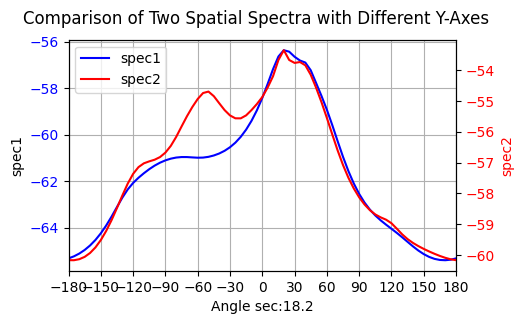

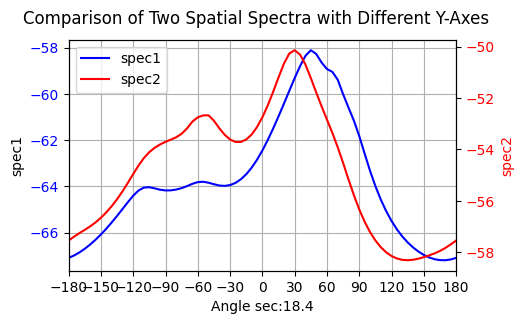

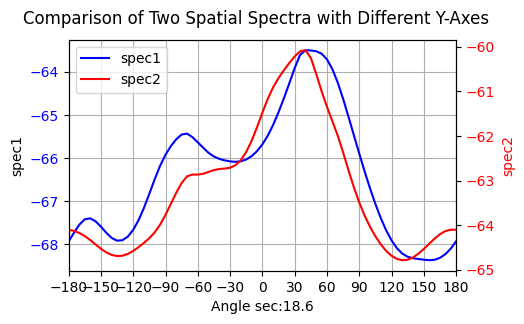

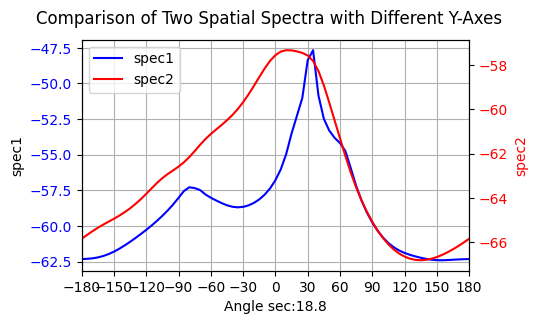

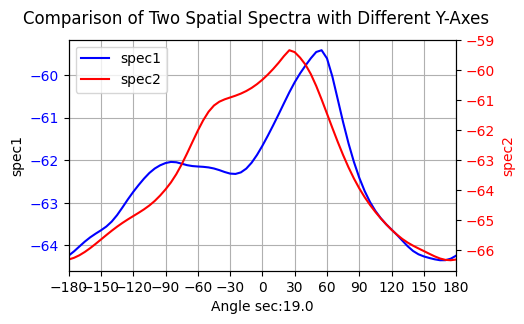

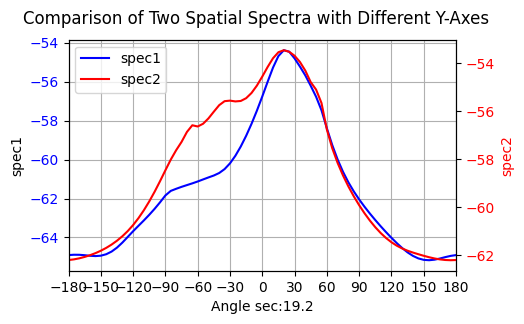

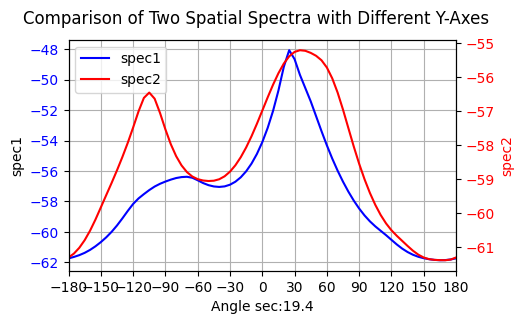

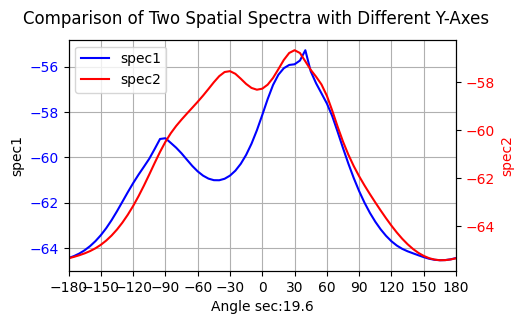

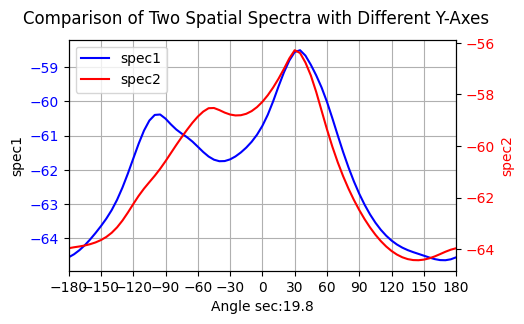

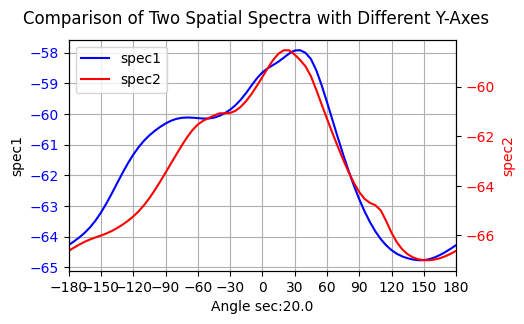

In [126]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_1 = dir_name + "cart_left600toright600_50_2_0.wav"
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_2 = dir_name + "cart_left600toright600_150_0.wav"

sec_left_1 = 18.2
sec_left_2 = 18.2
sec_right_1 = 18.4
sec_right_2 = 18.4
for i in range(10):
  compare_two_file_district(file_name_1, sec_left_1, sec_right_1, file_name_2, sec_left_2, sec_right_2)
  sec_left_1 += 0.2
  sec_left_2 += 0.2
  sec_right_1 += 0.2
  sec_right_2 += 0.2
  
# 200
# 10.2 /10
# 12.2 /10
# 14.2-15.0 /5
# 15.2-16.0 /5
# 16.2-17.0 /5
# 17.2-18.0 /5
# 18.2-20.2 /10
# 20.2-22.2 /10

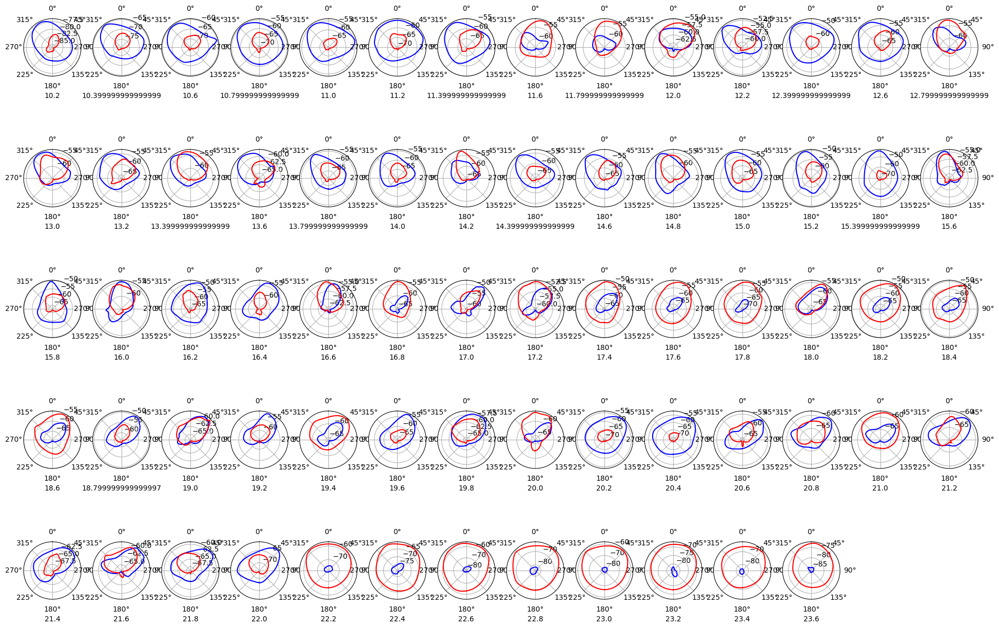

In [11]:
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_1 = dir_name + "cart_left600toright600_50_2_0.wav"
dir_name = str(Path.cwd().parent) + "/cart_datas/"
file_name_2 = dir_name + "cart_left600toright600_150_0.wav"

sec_left_1 = 10.2
sec_right_1 = 24.0
sec_left_2 = 10.2
sec_right_2 = 24.0

compare_two_file(file_name_1, sec_left_1, sec_right_1, file_name_2, sec_left_2, sec_right_2)

In [130]:
audio = load_onefile("test_rec0.wav")

audio.shape

(8, 480192)

(8, 480192)
[0.00000000e+00 6.25000000e-05 1.25000000e-04 ... 3.00118125e+01
 3.00118750e+01 3.00119375e+01]


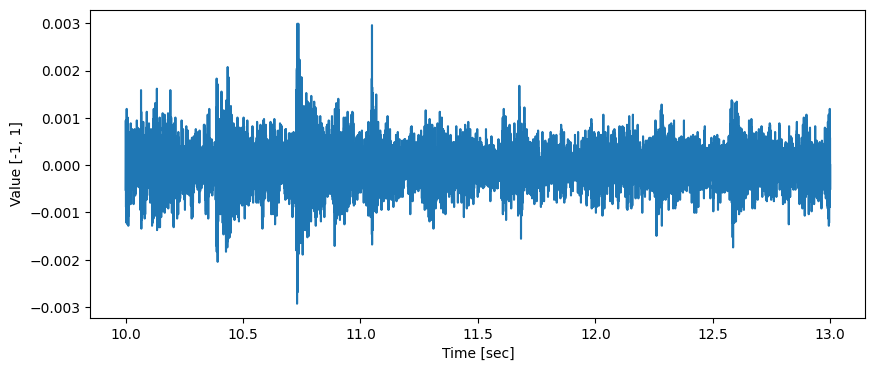

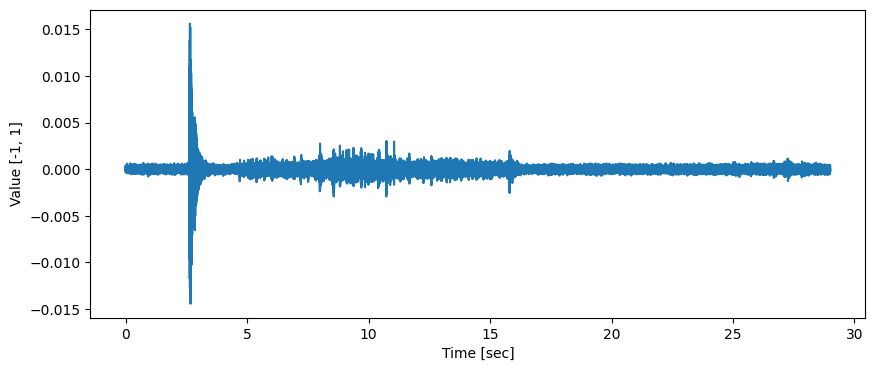

In [37]:
# 実験環境と同様(別PC)で録音したデータ
dir_name = str(Path.cwd().parent) + "/datas/audio_datas/"
file_name = dir_name + "3f_test_0_0.wav"

audio = load_onefile(file_name)
print(audio.shape)

sample_rate = 16000

x = np.array(range(audio.shape[1])) / sample_rate
print(x)

start_time = 10
end_time = 13
start_time_index = start_time * sample_rate
end_time_index = end_time * sample_rate

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x[start_time_index:end_time_index], audio[0][start_time_index:end_time_index])



start_time = 0
end_time = 29
start_time_index = start_time * sample_rate
end_time_index = end_time * sample_rate

plt.figure(figsize=(10, 4))
plt.xlabel("Time [sec]")
plt.ylabel("Value [-1, 1]")
plt.plot(x[start_time_index:end_time_index], audio[0][start_time_index:end_time_index])

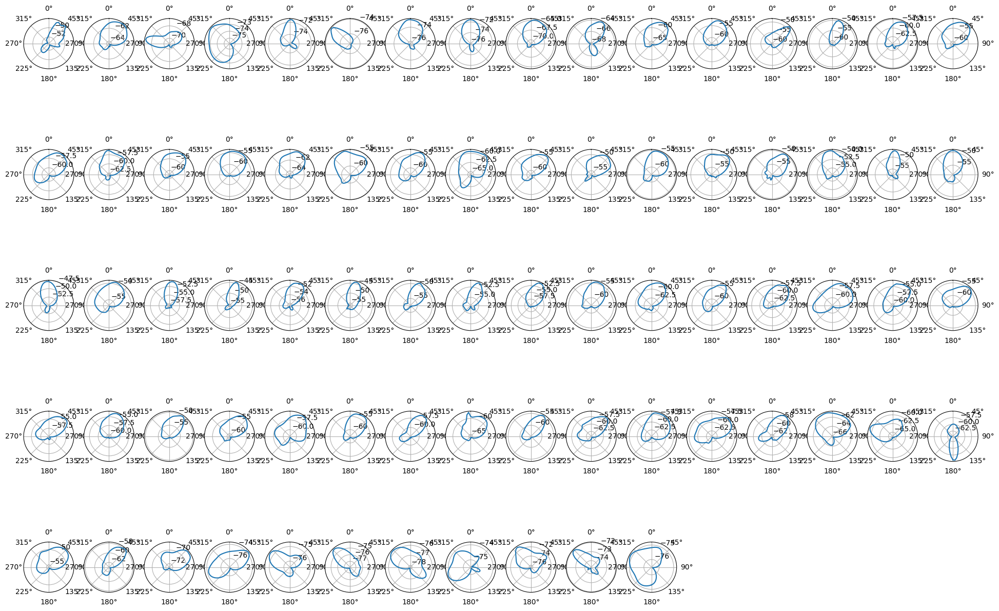

In [39]:
# 実験環境と同様(別PC)で録音したデータ
dir_name = str(Path.cwd().parent) + "/datas/audio_datas/"
file_name = dir_name + "3f_test_0_0.wav"

sec_left = 3
sec_right = 18

display_one_file(file_name, sec_left, sec_right)